<a href="https://colab.research.google.com/github/imcinstitute/ML-labs/blob/main/Lab_I_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns

!gsutil cp gs://imcinstitute/data/flight.csv .
flight = pd.read_csv("flight.csv")


Copying gs://imcinstitute/data/flight.csv...
/ [1 files][  1.5 MiB/  1.5 MiB]                                                
Operation completed over 1 objects/1.5 MiB.                                      


In [ ]:
flight.head(5)

,date,airline,departure_airport,arrival_airport,departure_delay,arrival_delay,dayofweek,month,delayed
0,2009-02-05,WN,SFO,LAX,2,1,5,2,0
1,2009-02-05,WN,SFO,LAX,47,43,5,2,1
2,2009-02-05,WN,SFO,LAX,52,42,5,2,1
3,2009-02-05,WN,SFO,LAX,92,84,5,2,1
4,2009-02-05,WN,SFO,LAX,80,76,5,2,1


In [ ]:
flight.columns

Index(['date', 'airline', 'departure_airport', 'arrival_airport',
       'departure_delay', 'arrival_delay', 'dayofweek', 'month', 'delayed'],
      dtype='object')

In [ ]:
#Data Exploration
flight.shape


(47785, 9)

In [ ]:
flight.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47785 entries, 0 to 47784
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   date               47785 non-null  object
 1   airline            47785 non-null  object
 2   departure_airport  47785 non-null  object
 3   arrival_airport    47785 non-null  object
 4   departure_delay    47785 non-null  int64 
 5   arrival_delay      47785 non-null  int64 
 6   dayofweek          47785 non-null  int64 
 7   month              47785 non-null  int64 
 8   delayed            47785 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 3.3+ MB


In [ ]:
flight.isnull().sum()

date                 0
airline              0
departure_airport    0
arrival_airport      0
departure_delay      0
arrival_delay        0
dayofweek            0
month                0
delayed              0
dtype: int64

In [ ]:
flight['airline'].value_counts()

OO    13863
UA    12018
WN     7814
AA     4039
CO     2383
US     1680
DL     1392
AS     1322
NW     1145
B6      661
F9      479
MQ      441
FL      410
HA      132
YV        6
Name: airline, dtype: int64

In [ ]:
flight['departure_airport'].value_counts()

SFO    47785
Name: departure_airport, dtype: int64

In [ ]:
flight['arrival_airport'].value_counts()

LAX    4240
SAN    2513
LAS    2388
DEN    2185
ORD    1975
       ... 
MCI      34
FLL      33
ASE      28
ANC      25
BZN      15
Name: arrival_airport, Length: 69, dtype: int64

In [ ]:
flight.hist(bins=100, figsize=(20,15))
plt.show()

In [ ]:
flight.describe()

In [ ]:
flight.describe(include=['int', 'int64', 'float', 'object'])

,date,airline,departure_airport,arrival_airport,departure_delay,arrival_delay,dayofweek,month,delayed
count,47785,47785,47785,47785,47785.000000,47785.000000,47785.000000,47785.000000,47785.000000
unique,365,15,1,69,NaN,NaN,NaN,NaN,NaN
top,2009-12-21,OO,SFO,LAX,NaN,NaN,NaN,NaN,NaN
freq,280,13863,47785,4240,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,27.721147,22.218269,3.930438,6.624150,0.477158
std,NaN,NaN,NaN,NaN,29.436796,31.939881,1.995762,3.392922,0.499483
min,NaN,NaN,NaN,NaN,1.000000,-65.000000,1.000000,1.000000,0.000000
25%,NaN,NaN,NaN,NaN,5.000000,-1.000000,2.000000,4.000000,0.000000
50%,NaN,NaN,NaN,NaN,16.000000,13.000000,4.000000,7.000000,0.000000
75%,NaN,NaN,NaN,NaN,42.000000,38.000000,6.000000,10.000000,1.000000


In [ ]:
flight.fillna(0,inplace=True)

In [ ]:
for col in ['dayofweek' , 'month']:
   flight[col] = flight[col].astype('category')


In [ ]:
flight.drop(['date','arrival_delay'], axis=1, inplace=True)

In [ ]:
#One-hot encoding
flight = pd.get_dummies(flight)

In [ ]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47785 entries, 0 to 47784
Columns: 106 entries, departure_delay to month_12
dtypes: int64(2), uint8(104)
memory usage: 5.5 MB


In [ ]:
#Create Train and Evaluate dataset
X = flight.drop('delayed',axis=1)
y = flight['delayed']


from sklearn.model_selection import train_test_split
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1) # 80% training and 20% test

print("Training features/target:", X_train.shape, y_train.shape)
print("Testing features/target:", X_test.shape, y_test.shape)

Training features/target: (38228, 105) (38228,)
Testing features/target: (9557, 105) (9557,)


In [ ]:
#import Scikit-learn
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from sklearn.datasets import load_wine
from sklearn.model_selection import train_test_split
from sklearn import metrics

# Create Decision Tree classifier object
decision_tree_classifier = DecisionTreeClassifier(criterion="entropy", max_depth=None)

# Train Decision Tree Classifier
decision_tree_classifier.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
#Make prediction
y_pred = decision_tree_classifier.predict(X_test)


from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix (predict/actual):\n", pd.DataFrame(cm))


decision_tree_classifier.score(X_test, y_test)

recall = np.diag(cm) / np.sum(cm, axis=1)
print("\nRecall:\n", pd.Series(recall))

precision = np.diag(cm) / np.sum(cm, axis=0)
print("\nPrecision:\n", pd.Series(precision))


from sklearn.metrics import f1_score
weighted_f1 = f1_score(y_test, y_pred, average="weighted")
print("\nF1 score:\n", weighted_f1)


Confusion Matrix (predict/actual):
       0     1
0  4245   799
1   817  3696

Recall:
 0    0.841594
1    0.818967
dtype: float64

Precision:
 0    0.838601
1    0.822247
dtype: float64

F1 score:
 0.8308909260469893


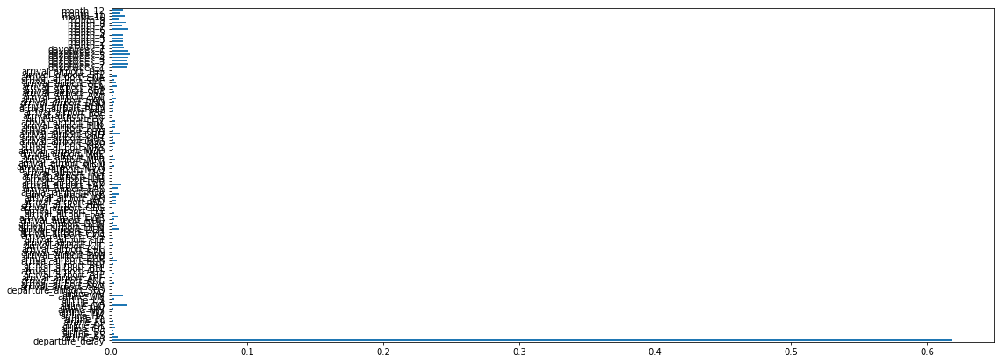

In [ ]:
%matplotlib inline
pd.Series(decision_tree_classifier.feature_importances_, index=X.columns).plot.barh(figsize=(18,7))


In [ ]:
pd.Series(decision_tree_classifier.feature_importances_, index=X.columns).sort_values(ascending=False).head(20)


departure_delay    0.618151
dayofweek_5        0.013718
dayofweek_2        0.012835
dayofweek_6        0.012394
month_6            0.012280
dayofweek_4        0.012255
dayofweek_1        0.011759
dayofweek_3        0.011418
airline_OO         0.011410
month_8            0.010373
month_10           0.010280
month_5            0.009923
dayofweek_7        0.009461
month_3            0.008767
month_4            0.008720
month_1            0.008480
month_12           0.008451
month_2            0.008389
airline_WN         0.008360
month_7            0.008333
dtype: float64

In [ ]:
# Figure out where graphviz executable lives
dotpath = !which dot
# Generate cut point diagram
from sklearn.tree import export_graphviz
import sys, subprocess
from IPython.display import Image

export_graphviz(decision_tree_classifier, feature_names=X.columns, class_names=['failure','success'],
                out_file='ml-good.dot', impurity=False, filled=True)
subprocess.check_call([dotpath[0],'-Tpng','ml-good.dot','-o','ml-good.png'])
Image('ml-good.png')


In [ ]:
#Quick Comparison
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.dummy import DummyClassifier


In [ ]:
classifiers = {
    "Dummy"        : DummyClassifier(strategy='uniform', random_state=2),
    "KNN(3)"       : KNeighborsClassifier(3), 
    "RBF SVM"      : SVC(gamma=2, C=1), 
    "Decision Tree": DecisionTreeClassifier(max_depth=7), 
    "Random Forest": RandomForestClassifier(max_depth=7, n_estimators=10, max_features=4), 
    "Neural Net"   : MLPClassifier(alpha=1), 
    "AdaBoost"     : AdaBoostClassifier(),
    "Naive Bayes"  : GaussianNB(), 
    "QDA"          : QuadraticDiscriminantAnalysis(),
    "Linear SVC"   : LinearSVC(),
    "Linear SVM"   : SVC(kernel="linear"), 
    "Gaussian Proc": GaussianProcessClassifier(1.0 * RBF(1.0)),
}